## Exercise 10.1
Find SIFT keypoints (kp1, kp2) in both images and compute their descriptors (des1, des2).
Match the SIFT features from both images to each other. Make sure to use cross checking.

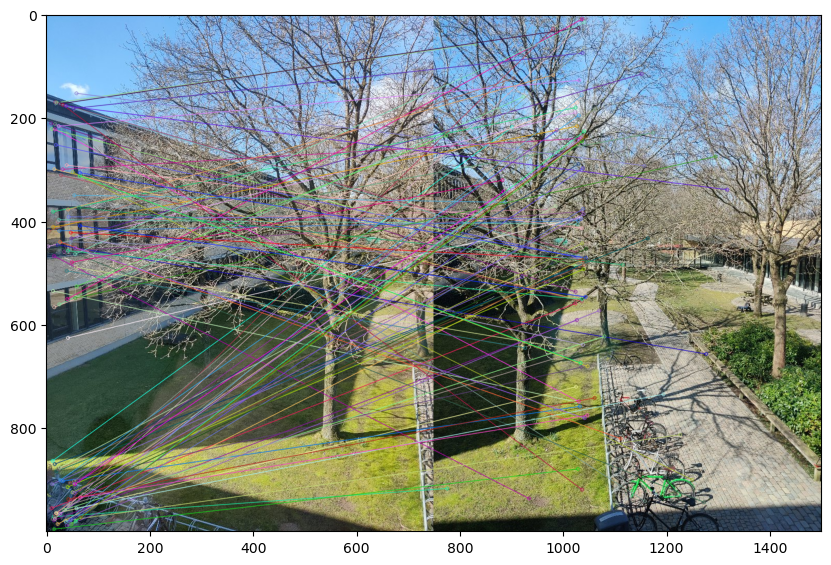

In [2]:
import cv2 
import matplotlib.pyplot as plt



img1 = cv2.imread('../Data/im1.jpg')[:,:,::-1]
img2 = cv2.imread('../Data/im2.jpg') [:,:,::-1]

img1_grey = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
img2_grey = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY) 


sift = cv2.SIFT_create()

kp1, des1 = sift.detectAndCompute(img1_grey, None) 
kp2, des2 = sift.detectAndCompute(img2_grey, None) 

bf = cv2.BFMatcher_create(crossCheck=True) 
matches = bf.match(des1, des2) 
img3 = cv2.drawMatches( img2, kp2, img1, kp1,matches[:100], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

fig,ax = plt.subplots(1,1,figsize=(10,10)) 
ax.imshow(img3)
plt.show()

### Exercise 10.2

* Implement a RANSAC algorithm for finding the homography between im1 and im2.

* What is the minimum number of matches you need to estimate a homography(Tip: it’s four)


#### Explain why this is the case.

The minimum number of matches to estimate a homography is: 



In [3]:
from utils.functions_10 import * 

H = estHomographyRANS(des1,des2,kp1,kp2,3)

NUmber of best inliers found: 935


### Exercise 10.3
* Wrap your code from the previous exercise in a function:
H = estHomographyRANSAC(kp1, des1, kp2, des2).
The function should take SIFT keypoints and descriptors computed on two images and use
RANSAC to estimate the best homography between the images.
Make sure that the function ends with fitting a homography to the largest amount of inliers.

In [4]:
## Check function_10.py 



### Exercise 10.5
* Use the mask returned by the warping function, to generate a single image that contains both
images. Where the images overlap you can use the intensities from either image.

In [5]:
def warpImage(im, H, xRange, yRange):

    T = np.eye(3)
    T[:2, 2] = [-xRange[0], -yRange[0]]
    H = T@H
    outSize = (xRange[1]-xRange[0], yRange[1]-yRange[0])
    mask = np.ones(im.shape[:2], dtype=np.uint8)*255
    imWarp = cv2.warpPerspective(im, H, outSize)
    maskWarp = cv2.warpPerspective(mask, H, outSize)
    return imWarp, maskWarp

In [6]:
xRange = [-400, int(img1.shape[1])]
yRange = [0, int(img1.shape[0])]

warped_img2,maskWarp2 = warpImage(img2,H,xRange,yRange)
warped_img1,maskWarp1 = warpImage(img1,np.identity(3),xRange,yRange)

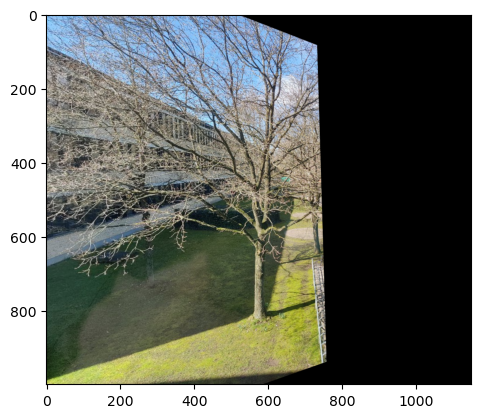

In [7]:
plt.imshow(warped_img2,cmap='gray')

### Exercise 10.5
* Use the mask returned by the warping function, to generate a single image that contains both
images. Where the images overlap you can use the intensities from either image

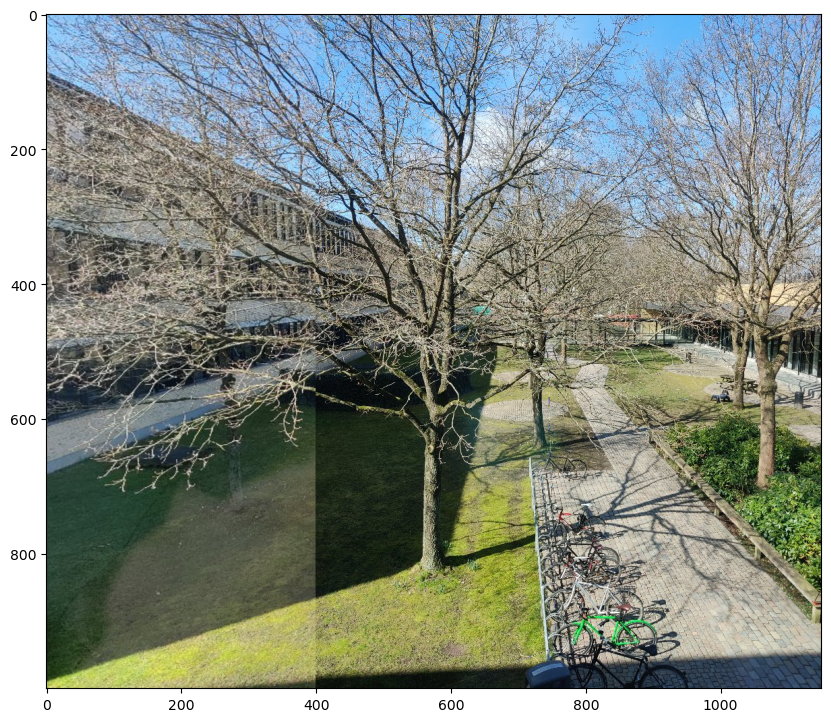

In [8]:
#Use the mask returned by the warping function, to generate a single image that contains both
# images. Where the images overlap you can use the intensities from either image.


def stitchImages(im1, im2, mask1, mask2):
    mask = mask1^mask2
    im2 = cv2.bitwise_and(im2,im2,mask = mask)
    panorama = (im1 + im2)
    return panorama



panorama = stitchImages(warped_img1,warped_img2,maskWarp1,maskWarp2)
fig,ax = plt.subplots(1,figsize=(10,10))
ax.imshow(panorama)
plt.show()

# Exercise 10.6
Devise a way to set xRange and yRange automatically so image content is not lost.
Tip: You can use the homography to warp points, but which ones?

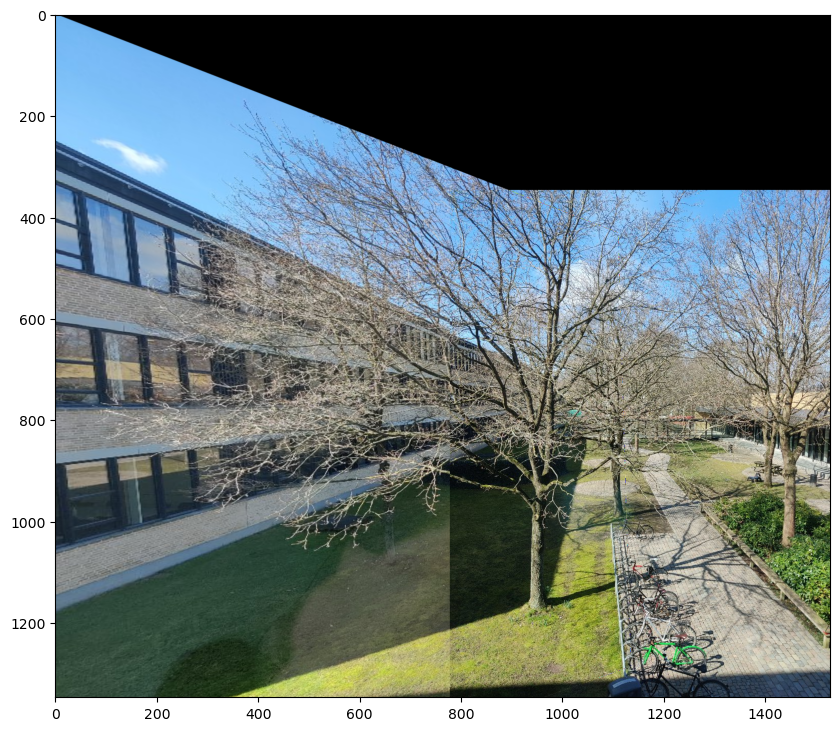

In [9]:
"""Devise a way to set xRange and yRange automatically so image content is not lost.
Tip: You can use the homography to warp points, but which ones?"""

def getRanges(im1, im2, H):
    """ provide comments for this function """  
    x1, y1 = im1.shape[:2]
    x2, y2 = im2.shape[:2]

    corners = np.array([[0, 0], [0, y2], [x2, 0], [x1, y2]])
    corners = np.vstack((corners.T, np.ones(4)))
    corners = H@corners
    corners = corners/corners[2]
    corners = corners[:2]
    
    xRange = [int(min(0, corners[0].min())), int(max(y2, corners[0].max()))]
    yRange = [int(min(0, corners[1].min())), int(max(x2, corners[1].max()))]

    return xRange, yRange

xRange,yRange = getRanges(img1,img2,H)


warped_img2,maskWarp2 = warpImage(img2,H,xRange,yRange)
warped_img1,maskWarp1 = warpImage(img1,np.identity(3),xRange,yRange)
panorama = stitchImages(warped_img1,warped_img2,maskWarp1,maskWarp2) 


fig,ax = plt.subplots(1,figsize=(10,10))
ax.imshow(panorama)
plt.show()

### Exercise 10.7
* Expand your algorithm so it’s able to handle the situation where three or more images are taken in a line

In [10]:
## I'll wrap the whole algorithm in one function 
# test 

from utils.functions_10 import * 

panorama = stitch_image(img1,img2)

NUmber of best inliers found: 972


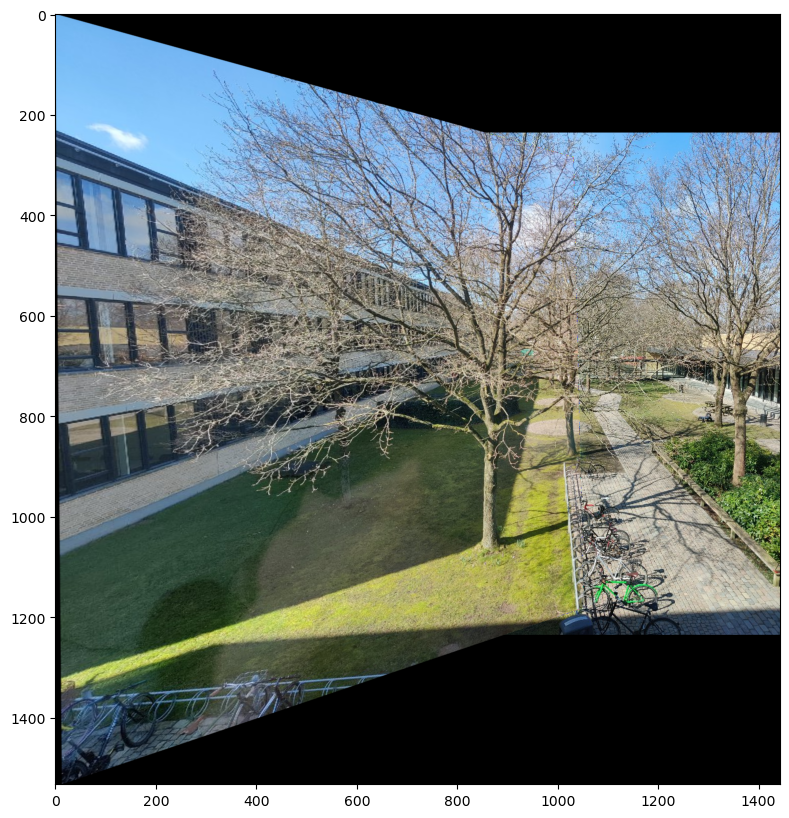

In [11]:
fig,ax = plt.subplots(1,figsize=(10,10))
ax.imshow(panorama)

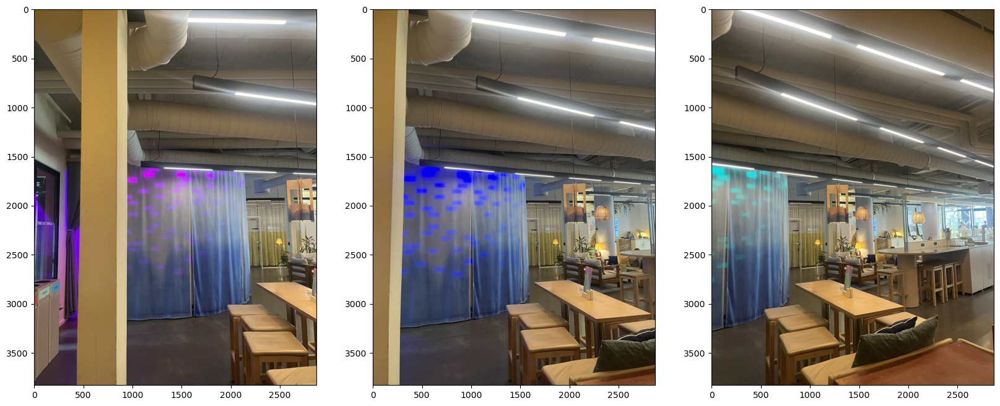

In [12]:
from utils.functions_10 import *
import cv2 
import matplotlib.pyplot as plt 


img1 = cv2.imread('../Data/stitch/1.jpg')[:,:,::-1]
img2 = cv2.imread('../Data/stitch/2.jpg')[:,:,::-1]
img3 = cv2.imread('../Data/stitch/3.jpg')[:,:,::-1]


images = [img1,img2,img3] 

scale_factor = 0.95

# Resize images
resized_images = [cv2.resize(img, (int(img.shape[1] * scale_factor), int(img.shape[0] * scale_factor))) for img in images]

# Display images
fig, axis = plt.subplots(1, 3, figsize=(20, 20))
for i in range(3):
    axis[i].imshow(resized_images[i])
plt.show()

NUmber of best inliers found: 1100
NUmber of best inliers found: 2597


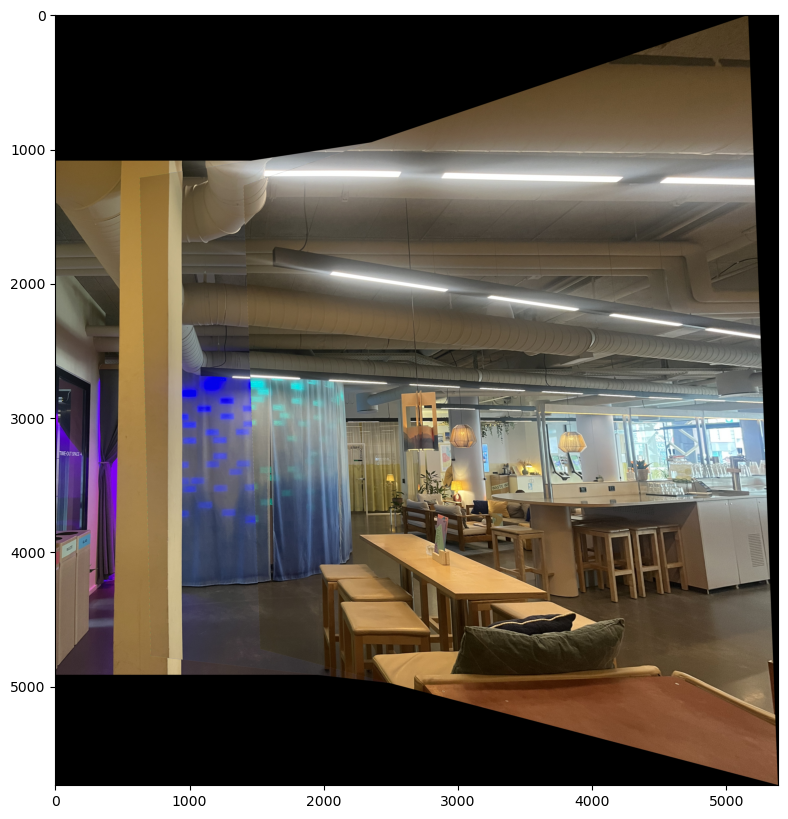

In [13]:
panorama = stitch_images(resized_images)

fig,axis = plt.subplots(1,figsize=(10,10))
axis.imshow(panorama)
plt.show()

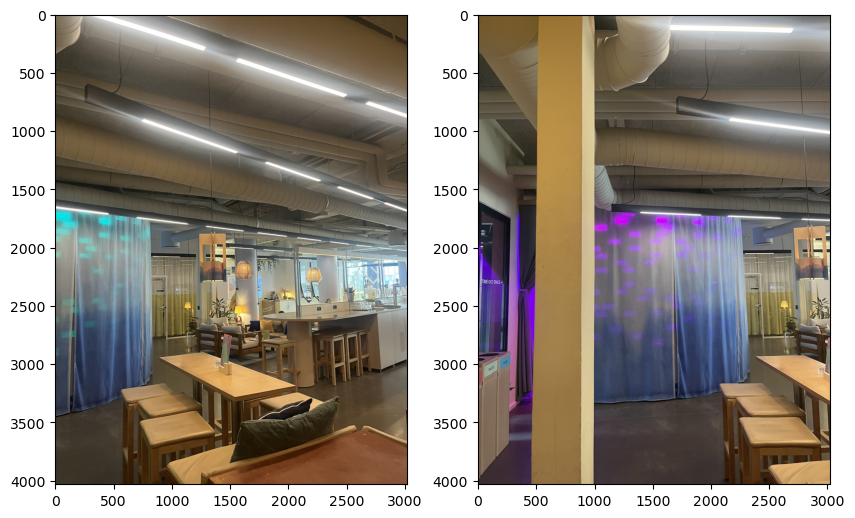

In [14]:
fig,axis = plt.subplots(1,2,figsize=(10,10))
axis[0].imshow(images[2])
axis[1].imshow(images[0])

In [15]:
panorama = stitch_image(resized_images[1],resized_images[0])

NUmber of best inliers found: 1098


NUmber of best inliers found: 1097


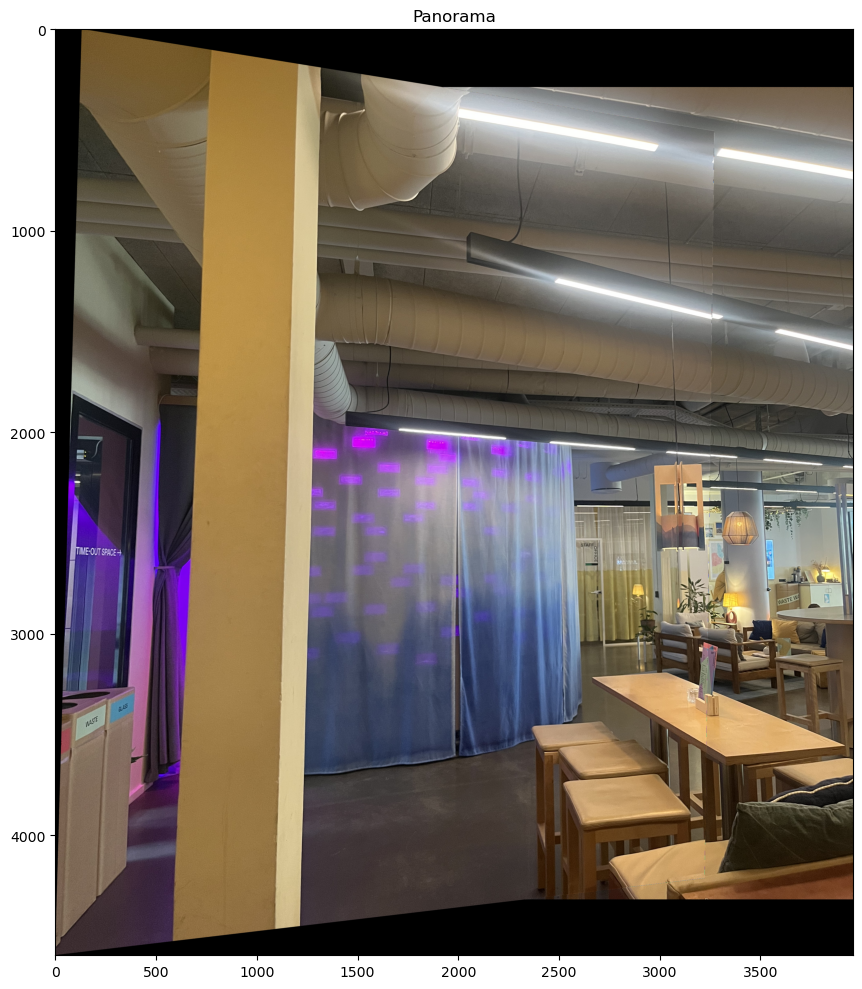

In [16]:
panorama = stitch_image(images[1],images[0])
fig,axis = plt.subplots(1,figsize=(10,10))
axis.imshow(panorama)
plt.title('Panorama')
plt.tight_layout()
plt.show()

In [ ]:
#

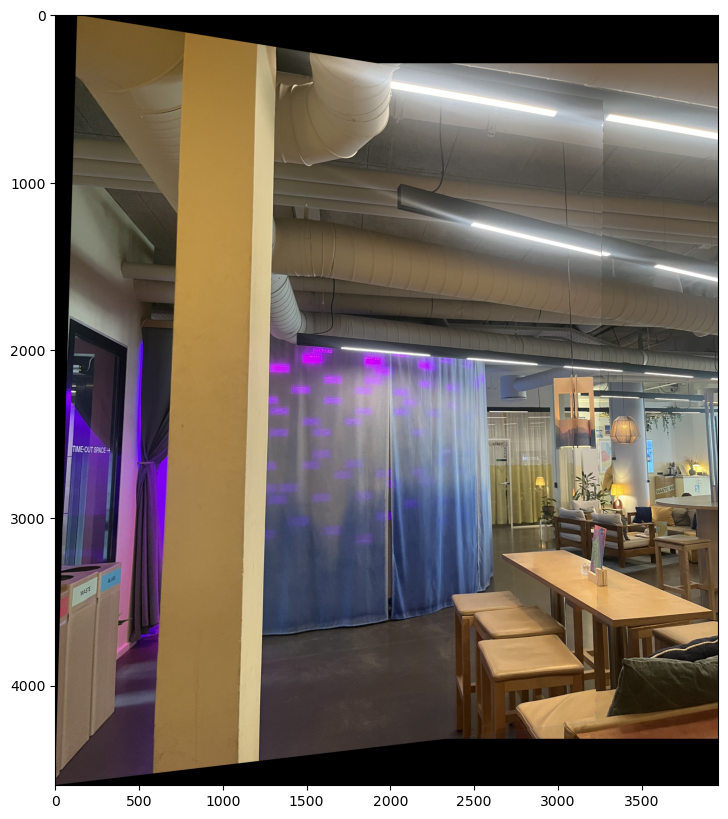

In [17]:
fig,ax = plt.subplots(1,figsize=(10,10))
ax.imshow(panorama)
plt.show()

In [2]:
### Quiz.

4.61*2.6**2


31.163600000000006